# Problem Statement

- The dataset is sourced from the "Getting Started - GAN" competition on Kaggle. This competition is targeted towards creating a Generative Adversarial Network (GAN).

- Problem - Design & train a GAN model to learn the artistic the style of Monet and apply it to a new photo. 

- **What is a GAN?**
    - GANs were first introduced in 2014 by Ian Goodfellow et al. They are a deep-learning based generative model. 
    - GANs consist of 2 neural networks that compete against one other in a rather zero-sum game fashion. `Generator` tries to fool the `Discriminator`
        - Generator: Model that is used to generate new examples from the problem domain. For example: Create _fake_ Monet-style paintings.
        - Discriminator: Model that is used to classify examples as real (a real Monet painting) or fake (an image created by the Generator).

- **How does a GAN work?**
     - The ultimate goal of a GAN is to create a generator that can fool the disriminator with its output (images usually). Thereby, we create a deep learning model that can create _fake_ images that look _real_ enough to pass the discriminator's sniff test. 
     - This is accomplished by taking the following steps
         1.  The generator generates a batch of sample images (starts out with random noise). These samples and real images are passed on to the discriminator to be classified as either _real_ or _fake_.
         2. The discriminator is heavily penalized for incorrectly classifying either of the samples. At the same time, the generator is updated based on the discriminators' results. 
             - Discriminator: Correctly identifies real & fake images. No update to discrimnator. Generator is heavily penalized and its weights are updated.
             - Discriminator: Incorrectly identifies real & fake images. No update to generator. Discriminator is heavily penalized and its weights are updated.
         3. This process is repeated for a pre-determined number of epochs.
         4. In an ideal world, the generator creates perfect images that fool the discriminator 100% of the time. 

- **What type of problems are GANs suited for?**
    - Copying a _style_ of an image from one to another (the main task for this challenge)
    - Generating an image from a text description
    - Artificially increasing the resolution of images
    - etc 

- There are multiple varieties of GANs
    - Vanilla GAN: A straight forward generator & discriminator setup for the neural network
    - CGAN: Conditional GAN. The generator & discriminator are provided additional info about the class labels.
    - DCGAN: Deep Convolutional GAN. Generator used deep convolutional networks to create high quality images.
    - CycleGAN: Really useful for learning how to apply an image style of a picture to another aka image-to-image translations. 
    - Text to Image GANs: As the name suggests, they convert text description to an image. Example: Stable Diffusion
    - and many, many more.
- For this problem, I will mostly focus my efforts on creating a CycleGAN since it fits perfectly with the problem we are trying to solve. 
- Github link to the project: https://github.com/karansangha/dtsa5511-week5-GAN

#### Data Description
- The dataset consists of 2 types of images
    - 300 Real Monet paintings
    - 7000 photos that we are to convert to a style of a Monet painting
- Each image is of 256 by 256 pixels
- Each image contains 3 color channels: Red, Green & Blue

#### References

- CycleGAN | Tensorflow Core. TensorFlow. (n.d.). Retrieved October 7, 2022, from https://www.tensorflow.org/tutorials/generative/cyclegan 
- Isola, P., Zhu, J.-Y., Zhou, T., & Efros, A. A. (2016). Image-to-image translation with conditional adversarial networks. Retrieved October 6, 2022, from Ανακτήθηκε από http://arxiv.org/abs/1611.07004
- Jang, A. (2020, August 29). Monet Cyclegan Tutorial. Kaggle. Retrieved October 7, 2022, from https://www.kaggle.com/code/amyjang/monet-cyclegan-tutorial/notebook 
- nkmk. (n.d.). Convert BGR and RGB with python, opencv (cvtcolor). Convert BGR and RGB with Python, OpenCV (cvtColor). Retrieved October 7, 2022, from https://note.nkmk.me/en/python-opencv-bgr-rgb-cvtcolor/ 
- Stack Overflow. (2014, March 3). Python - calculate histogram of image. Stack Overflow. Retrieved October 6, 2022, from https://stackoverflow.com/questions/22159160/python-calculate-histogram-of-image 
- Ulyanov, D., Vedaldi, A., & Lempitsky, V. (2016). Instance normalization: The missing ingredient for fast stylization. Retrieved October 6, 2022, from Ανακτήθηκε από http://arxiv.org/abs/1607.08022

# Exploratory Data Analysis

In [35]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import cv2
import math
import os

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

from IPython.display import clear_output
import shutil
import time

%matplotlib inline
import matplotlib.pyplot as plt

In [33]:
tf.__version__

'2.10.0'

In [4]:
MONET_JPG_PATH = './monet_jpg/'
PHOTO_JPG_PATH = './photo_jpg/'

print('Number of images in Monet directory: ', len(os.listdir(MONET_JPG_PATH)))
print('Number of images in Photo directory: ', len(os.listdir(PHOTO_JPG_PATH)))

Number of images in Monet directory:  300
Number of images in Photo directory:  7038


## Visualize photos from the dataset

In [5]:
def visualize_images(path, n_images, x_label, figsize=(16, 16)):
    plt.figure(figsize=figsize)
    w = int(n_images ** 0.5)
    h = math.ceil(n_images / w)
    
    all_names = os.listdir(path)
    image_names = all_names[:n_images]   
            
    for ind, image_name in enumerate(image_names):
        img = cv2.imread(os.path.join(path, image_name))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 
        plt.subplot(w, h, ind + 1)
        plt.imshow(img)
        plt.xlabel(f"{x_label}_{ind+1}")
        plt.xticks([])
        plt.yticks([])
    
    plt.show()

- Show 3 random photos from both `Monet` and `Photo` folders

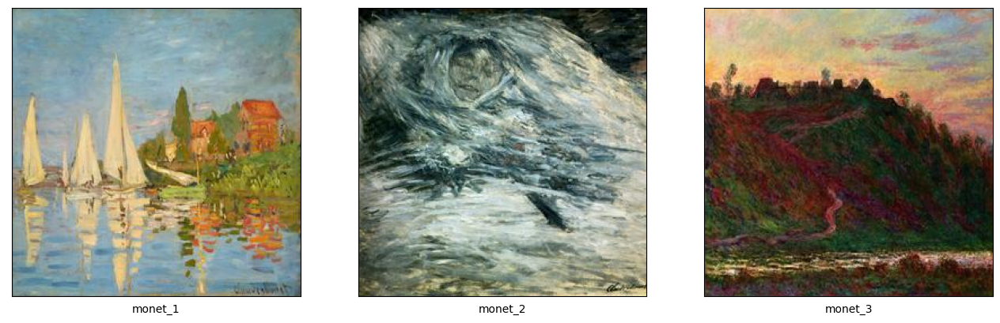

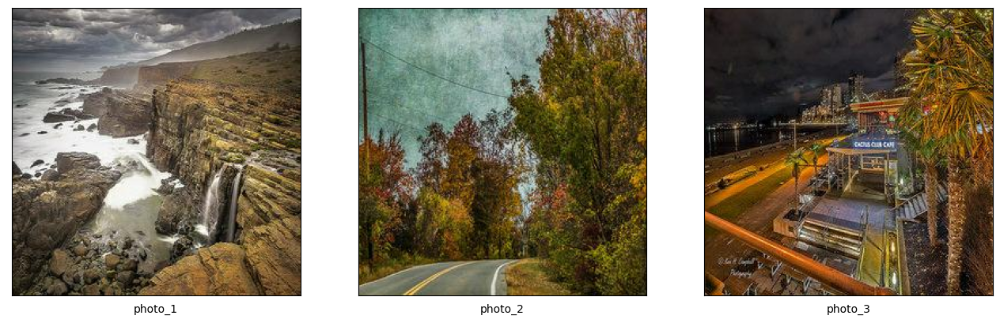

In [7]:
visualize_images(MONET_JPG_PATH, 3, "monet")
visualize_images(PHOTO_JPG_PATH, 3, "photo")

- Sidenote: Monet did some amazing work. Wow! 

## RGB Histogram

- The height and width of these images are 256 and 256 respectively. 
- Since these are color images, the # of color channels = 3 (Red, Green & Blue).
- Let's visualize the histogram of each channel (RGB) for a random painting from `monet` and `photo` folder 

In [9]:
def show_color_histogram(path):
    image_names = os.listdir(path)
    image_name = np.random.choice(image_names)
    img = cv2.imread(os.path.join(path, image_name))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))
    
    ax1.imshow(img)
    
    color = ('b','g','r')
    for i,col in enumerate(color):
        histr = cv2.calcHist([img],[i],None,[256],[0,256])
        ax2.plot(histr,color = col)
        ax2.axis(xmin=0, xmax=256)
    # fig.show()

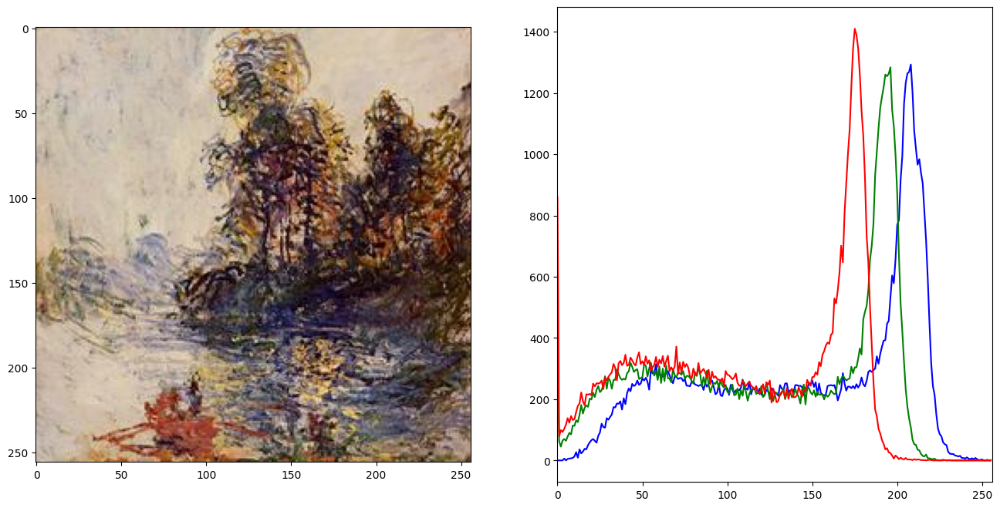

In [10]:
show_color_histogram(MONET_JPG_PATH)

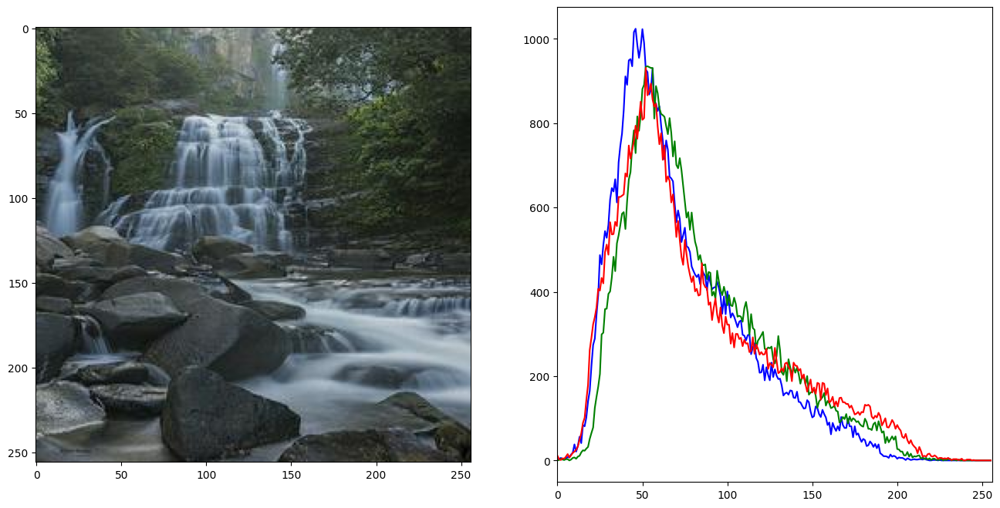

In [11]:
show_color_histogram(PHOTO_JPG_PATH)

## Prepare data for neural network training

In [14]:
monet_ds = tf.keras.preprocessing.image_dataset_from_directory(
    MONET_JPG_PATH, label_mode=None, image_size=(256, 256), batch_size=1
)
monet_ds = monet_ds.map(lambda x: x / 255.0)

photo_ds = tf.keras.preprocessing.image_dataset_from_directory(
    PHOTO_JPG_PATH, label_mode=None, image_size=(256, 256), batch_size=1
)
photo_ds = photo_ds.map(lambda x: x / 255.0)

Found 300 files belonging to 1 classes.
Found 7038 files belonging to 1 classes.


In [16]:
for image_batch in monet_ds:
    print(image_batch.shape)
    break

(1, 256, 256, 3)


- Each batch in the `monet_ds` dataset contains **one** photo with the following dimensions: 256, 256, 3.
- As noted in the previous section, (256, 256) represents the width & height of the image while 3 represents the number of color channels.

#### Pick a random image from each dataset for testing in later sections

In [17]:
sample_monet = next(iter(monet_ds))
sample_photo = next(iter(photo_ds))

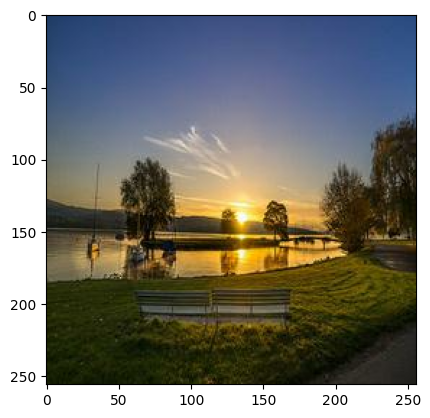

In [18]:
plt.imshow(sample_photo[0])
plt.show()

# Model Architecture

- As mentioned in the `Problem Statement` section, I will be training a CycleGAN model to create Monet-esque paintings from real images. 
- CycleGAN uses a full-fledged UNET architecture

**U-Net architecture**
- UNET is a neural network architecture developed by Olaf Ronneberger et al. for Biomedical Image Segmentation in 2015 at the University of Freiburg, Germany. 
- It is a U-shaped encoder-decoder network architecture, which consists of four encoder blocks and four decoder blocks that are connected via a bridge.
    
**What is an encoder block?**
- The encoder network acts as the feature extractor and learns an abstract representation of the input image through a sequence of the encoder blocks. 
- Each encoder block consists of two 3x3 convolutions, where each convolution is followed by a ReLU (Rectified Linear Unit) activation function. The ReLU activation function introduces non-linearity into the network, which helps in the better generalization of the training data. 
- Next, follows a 2x2 max-pooling layer where the spatial dimensions (height and width) of the feature maps are reduced by half. This reduces the computational cost by decreasing the number of trainable parameters.
- Each convolutional layer is followed by a batch normalization layer. This layer reduces internal covariance shift and makes the model more stable during the training process.
    
**What is a decoder block?**
- The decoder network is used to take the abstract representation and generate a semantic segmentation mask.
- The decoder block starts with a 2x2 transpose convolution, followed by two 3x3 convolutoinal layers where each convolution is folllowed by a ReLU activatoin.
- Similar to an encoder block, each convolutional layer is followed by a batch normalization layer.

**What is a bridge?**
- As the name suggests, the bridge connects the encoder and decoded blocks.
- It consists of two 3x3 convolutional layers each followed by a ReLU activation.

**Actual Model**
- The model architecture below follows a slightly modified U-Net architecture based on research done by (Isola, 2017)
- The batch normalization layer is replaced by InstanceNormalization layer described by (Ulyanov, 2017)

### Define helper functions

In [45]:
class InstanceNormalization(tf.keras.layers.Layer):
    # InstanceNormalization layer from (Ulyanov, 2017)

    def __init__(self, epsilon=1e-5):
        super(InstanceNormalization, self).__init__()
        self.epsilon = epsilon

    def build(self, input_shape):
        self.scale = self.add_weight(
            name='scale',
            shape=input_shape[-1:],
            initializer=tf.random_normal_initializer(1., 0.02),
            trainable=True)

        self.offset = self.add_weight(
            name='offset',
            shape=input_shape[-1:],
            initializer='zeros',
            trainable=True)

    def call(self, x):
        mean, variance = tf.nn.moments(x, axes=[1, 2], keepdims=True)
        inv = tf.math.rsqrt(variance + self.epsilon)
        normalized = (x - mean) * inv
        return self.scale * normalized + self.offset

def downsample(filters, size, norm_type='batchnorm', apply_norm=True):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

    if apply_norm:
        if norm_type.lower() == 'batchnorm':
            result.add(tf.keras.layers.BatchNormalization())
        elif norm_type.lower() == 'instancenorm':
            result.add(InstanceNormalization())

    result.add(tf.keras.layers.LeakyReLU())

    return result


def upsample(filters, size, norm_type='batchnorm', apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(
      tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                      padding='same',
                                      kernel_initializer=initializer,
                                      use_bias=False))

    if norm_type.lower() == 'batchnorm':
        result.add(tf.keras.layers.BatchNormalization())
    elif norm_type.lower() == 'instancenorm':
        result.add(InstanceNormalization())

    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))

    result.add(tf.keras.layers.ReLU())

    return result

### Define generator & discriminator functions

In [46]:
def generator(output_channels, norm_type='batchnorm'):
    # Modified u-net generator from (Isola, 2017)

    down_stack = [
      downsample(64, 4, norm_type, apply_norm=False),  # (bs, 128, 128, 64)
      downsample(128, 4, norm_type),  # (bs, 64, 64, 128)
      downsample(256, 4, norm_type),  # (bs, 32, 32, 256)
      downsample(512, 4, norm_type),  # (bs, 16, 16, 512)
      downsample(512, 4, norm_type),  # (bs, 8, 8, 512)
      downsample(512, 4, norm_type),  # (bs, 4, 4, 512)
      downsample(512, 4, norm_type),  # (bs, 2, 2, 512)
      downsample(512, 4, norm_type),  # (bs, 1, 1, 512)
    ]

    up_stack = [
      upsample(512, 4, norm_type, apply_dropout=True),  # (bs, 2, 2, 1024)
      upsample(512, 4, norm_type, apply_dropout=True),  # (bs, 4, 4, 1024)
      upsample(512, 4, norm_type, apply_dropout=True),  # (bs, 8, 8, 1024)
      upsample(512, 4, norm_type),  # (bs, 16, 16, 1024)
      upsample(256, 4, norm_type),  # (bs, 32, 32, 512)
      upsample(128, 4, norm_type),  # (bs, 64, 64, 256)
      upsample(64, 4, norm_type),  # (bs, 128, 128, 128)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(
      output_channels, 4, strides=2,
      padding='same', kernel_initializer=initializer,
      activation='tanh')  # (bs, 256, 256, 3)

    concat = tf.keras.layers.Concatenate()

    inputs = tf.keras.layers.Input(shape=[None, None, 3])
    x = inputs

    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = concat([x, skip])

    x = last(x)

    return tf.keras.Model(inputs=inputs, outputs=x)

def discriminator(norm_type='batchnorm', target=True):
    initializer = tf.random_normal_initializer(0., 0.02)

    inp = tf.keras.layers.Input(shape=[None, None, 3], name='input_image')
    x = inp

    if target:
        tar = tf.keras.layers.Input(shape=[None, None, 3], name='target_image')
        x = tf.keras.layers.concatenate([inp, tar])  # (bs, 256, 256, channels*2)

    down1 = downsample(64, 4, norm_type, False)(x)  # (bs, 128, 128, 64)
    down2 = downsample(128, 4, norm_type)(down1)  # (bs, 64, 64, 128)
    down3 = downsample(256, 4, norm_type)(down2)  # (bs, 32, 32, 256)

    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (bs, 34, 34, 256)
    conv = tf.keras.layers.Conv2D(
      512, 4, strides=1, kernel_initializer=initializer,
      use_bias=False)(zero_pad1)  # (bs, 31, 31, 512)

    if norm_type.lower() == 'batchnorm':
        norm1 = tf.keras.layers.BatchNormalization()(conv)
    elif norm_type.lower() == 'instancenorm':
        norm1 = InstanceNormalization()(conv)

    leaky_relu = tf.keras.layers.LeakyReLU()(norm1)

    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (bs, 33, 33, 512)

    last = tf.keras.layers.Conv2D(
      1, 4, strides=1,
      kernel_initializer=initializer)(zero_pad2)  # (bs, 30, 30, 1)

    if target:
        return tf.keras.Model(inputs=[inp, tar], outputs=last)
    else:
        return tf.keras.Model(inputs=inp, outputs=last)


In [21]:
OUTPUT_CHANNELS = 3

generator_g = generator(OUTPUT_CHANNELS, norm_type='instancenorm')
generator_f = generator(OUTPUT_CHANNELS, norm_type='instancenorm')

discriminator_x = discriminator(norm_type='instancenorm', target=False)
discriminator_y = discriminator(norm_type='instancenorm', target=False)

### Define loss functions

In [39]:
LAMBDA = 10

loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real, generated):
    real_loss = loss_obj(tf.ones_like(real), real)

    generated_loss = loss_obj(tf.zeros_like(generated), generated)

    total_disc_loss = real_loss + generated_loss

    return total_disc_loss * 0.5

def generator_loss(generated):
    return loss_obj(tf.ones_like(generated), generated)

def calc_cycle_loss(real_image, cycled_image):
    loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))

    return LAMBDA * loss1

def identity_loss(real_image, same_image):
    loss = tf.reduce_mean(tf.abs(real_image - same_image))
    return LAMBDA * 0.5 * loss

In [23]:
generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

### Train the GAN model

- For brevity's sake, I have already trained the model for 190 epochs since each epoch takes 2 minutes to train, on average.
- The 

In [24]:
checkpoint_path = "./checkpoints/train"

ckpt = tf.train.Checkpoint(generator_g=generator_g,
                           generator_f=generator_f,
                           discriminator_x=discriminator_x,
                           discriminator_y=discriminator_y,
                           generator_g_optimizer=generator_g_optimizer,
                           generator_f_optimizer=generator_f_optimizer,
                           discriminator_x_optimizer=discriminator_x_optimizer,
                           discriminator_y_optimizer=discriminator_y_optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
    ckpt.restore(ckpt_manager.latest_checkpoint)
    print ('Latest checkpoint restored!!')

Latest checkpoint restored!!


In [44]:
@tf.function
def train_step(real_x, real_y):
  # persistent is set to True because the tape is used more than
  # once to calculate the gradients.
    with tf.GradientTape(persistent=True) as tape:
    # Generator G translates X -> Y
    # Generator F translates Y -> X.

        fake_y = generator_g(real_x, training=True)
        cycled_x = generator_f(fake_y, training=True)

        fake_x = generator_f(real_y, training=True)
        cycled_y = generator_g(fake_x, training=True)

        # same_x and same_y are used for identity loss.
        same_x = generator_f(real_x, training=True)
        same_y = generator_g(real_y, training=True)

        disc_real_x = discriminator_x(real_x, training=True)
        disc_real_y = discriminator_y(real_y, training=True)

        disc_fake_x = discriminator_x(fake_x, training=True)
        disc_fake_y = discriminator_y(fake_y, training=True)

        # calculate the loss
        gen_g_loss = generator_loss(disc_fake_y)
        gen_f_loss = generator_loss(disc_fake_x)

        total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)

        # Total generator loss = adversarial loss + cycle loss
        total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y, same_y)
        total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x, same_x)

        disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
        disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)

        # Calculate the gradients for generator and discriminator
        generator_g_gradients = tape.gradient(total_gen_g_loss, 
                                            generator_g.trainable_variables)
        generator_f_gradients = tape.gradient(total_gen_f_loss, 
                                            generator_f.trainable_variables)

        discriminator_x_gradients = tape.gradient(disc_x_loss, 
                                                discriminator_x.trainable_variables)
        discriminator_y_gradients = tape.gradient(disc_y_loss, 
                                                discriminator_y.trainable_variables)

        # Apply the gradients to the optimizer
        generator_g_optimizer.apply_gradients(zip(generator_g_gradients, 
                                                generator_g.trainable_variables))

        generator_f_optimizer.apply_gradients(zip(generator_f_gradients, 
                                                generator_f.trainable_variables))

        discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients,
                                                    discriminator_x.trainable_variables))

        discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients,
                                                    discriminator_y.trainable_variables))
        
        
def generate_images(model, test_input):
    prediction = model(test_input)

    plt.figure(figsize=(12, 12))

    display_list = [test_input[0], prediction[0]]
    title = ['Input Image', 'Monet-esque Image']
    
    # print(f'test_input.shape = {test_input[0].shape} | prediction.shape = {prediction[0].shape}')
    for i in range(2):
        plt.subplot(1, 2, i+1) 
        plt.title(title[i])
        plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.axis('off')
    plt.show()

Currently processing epoch #190


2022-10-07 00:21:20.249357: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


..............................

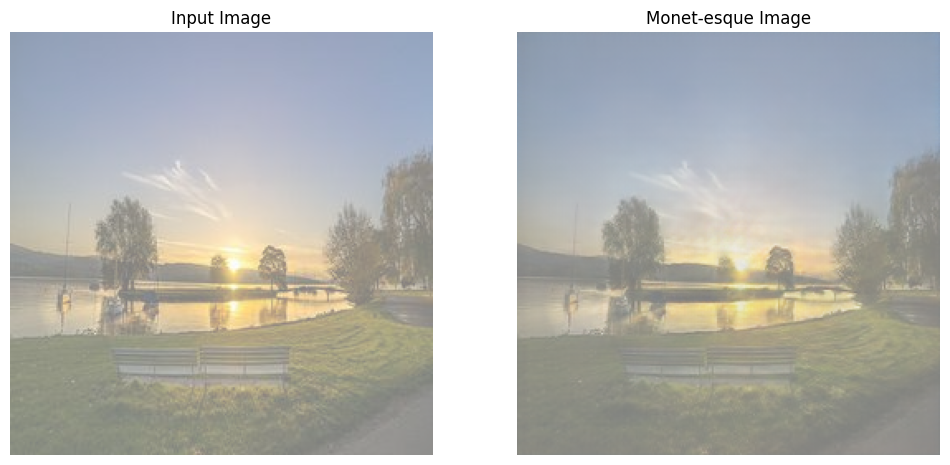

Time taken for epoch 190 is 143.51113510131836 sec

Currently processing epoch #191
..............................

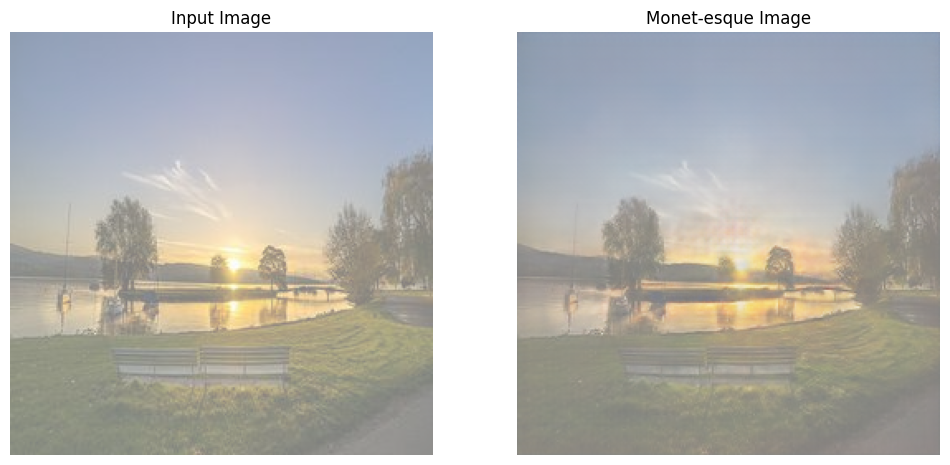

Time taken for epoch 191 is 110.18162989616394 sec

Currently processing epoch #192
..............................

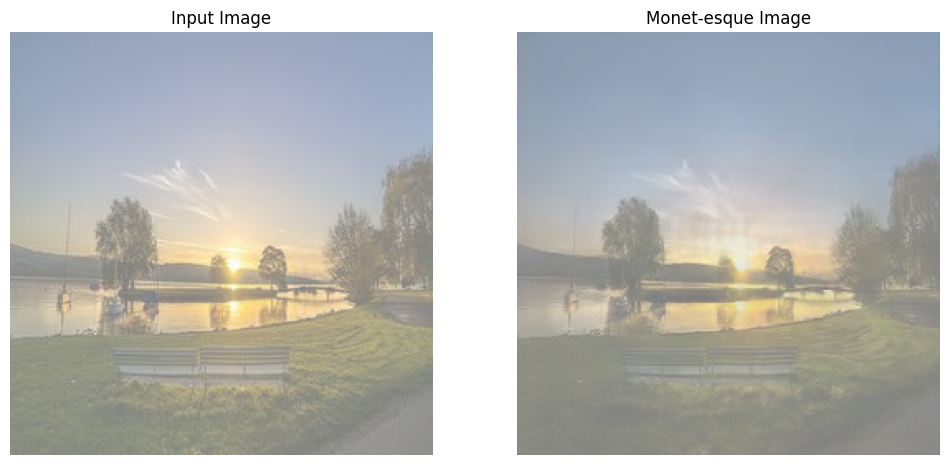

Time taken for epoch 192 is 110.14292001724243 sec

Currently processing epoch #193
..............................

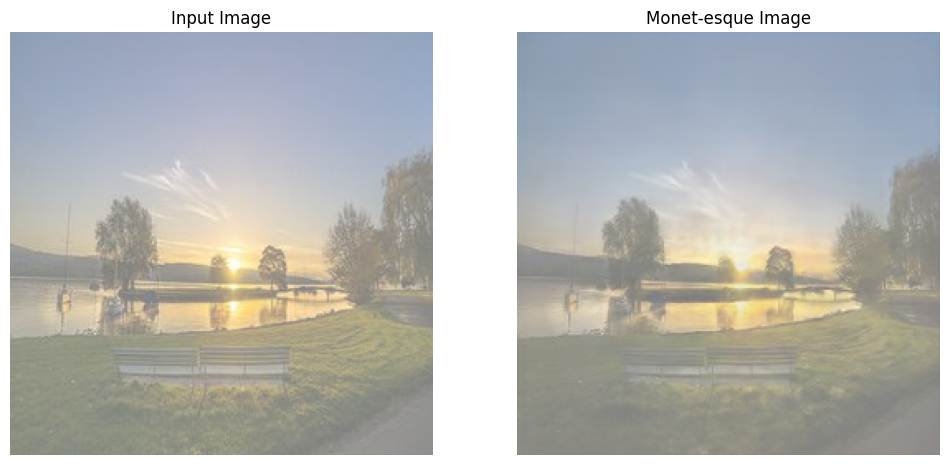

Time taken for epoch 193 is 109.98639273643494 sec

Currently processing epoch #194
..............................

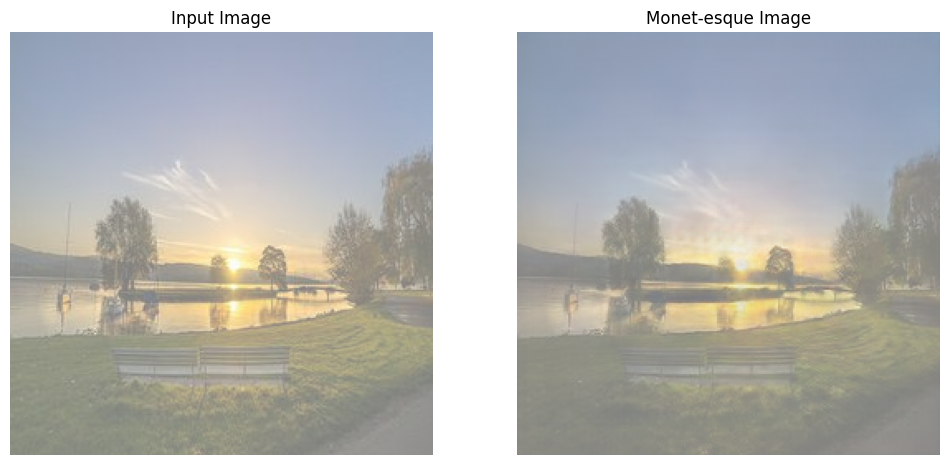

Time taken for epoch 194 is 109.93346500396729 sec

Currently processing epoch #195
..............................

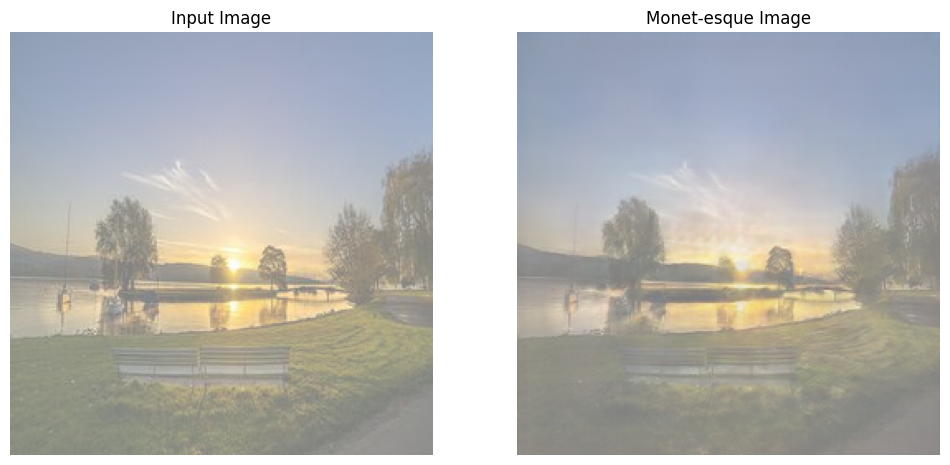

Time taken for epoch 195 is 111.0046877861023 sec

Currently processing epoch #196
..............................

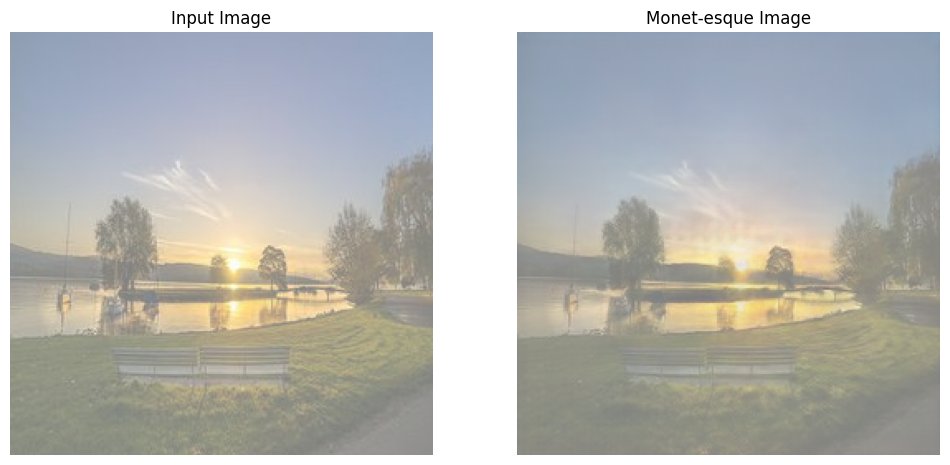

Time taken for epoch 196 is 110.42746186256409 sec

Currently processing epoch #197
..............................

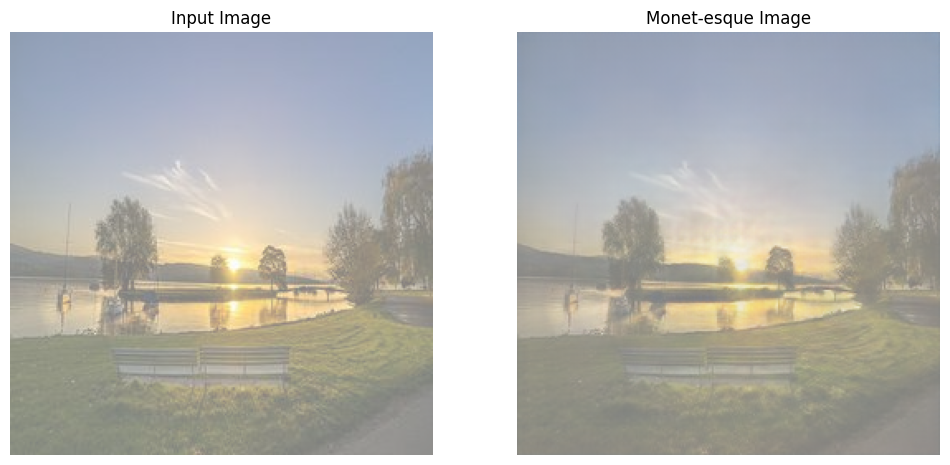

Time taken for epoch 197 is 110.67402005195618 sec

Currently processing epoch #198
..............................

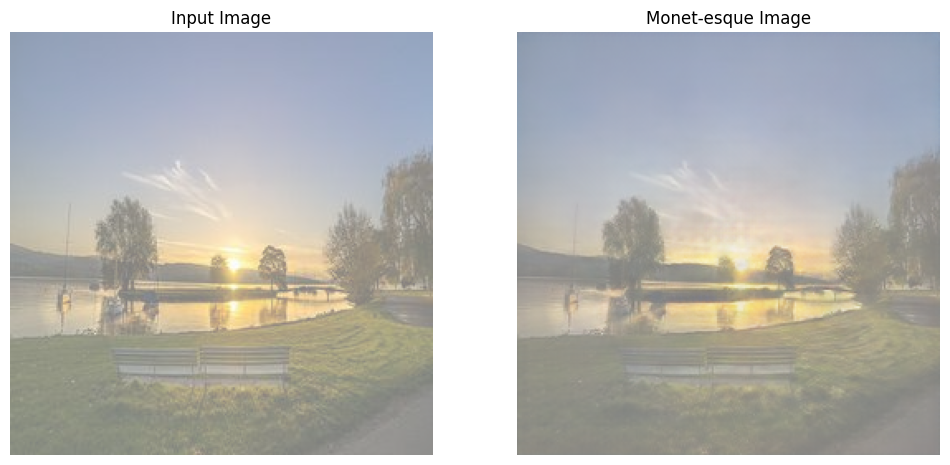

Time taken for epoch 198 is 110.05024099349976 sec

Currently processing epoch #199
..............................

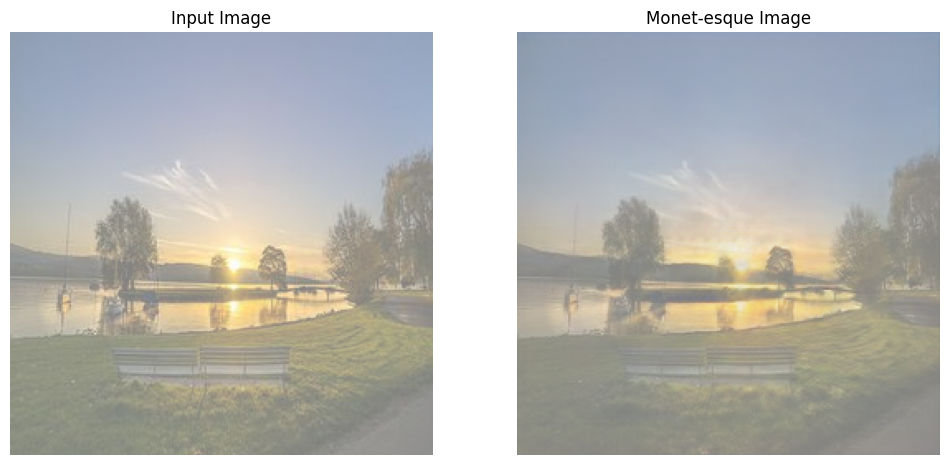

Time taken for epoch 199 is 110.87794017791748 sec



In [47]:
EPOCHS = 10

for epoch in range(EPOCHS):
    print(f'Currently processing epoch #{epoch+190}')
    start = time.time()

    n = 0
    for image_x, image_y in tf.data.Dataset.zip((monet_ds, photo_ds)):
        train_step(image_x, image_y)
        if n % 10 == 0:
            print ('.', end='')
        n += 1

    # clear_output(wait=True)
    generate_images(generator_g, sample_photo)

    if (epoch + 1) % 10 == 0:
        ckpt_save_path = ckpt_manager.save()
        print ('Saving checkpoint for epoch {} at {}'.format(epoch+1,
                                                         ckpt_save_path))

    print (f'Time taken for epoch {epoch + 190} is {time.time()-start} sec\n')

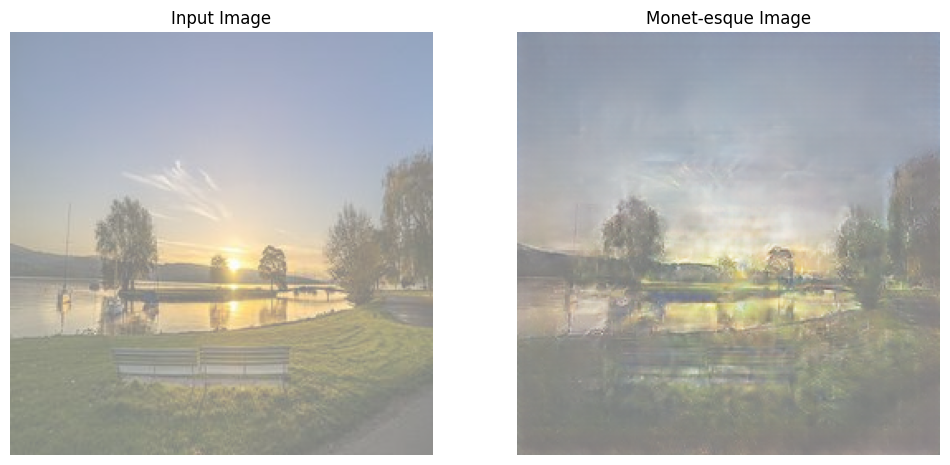

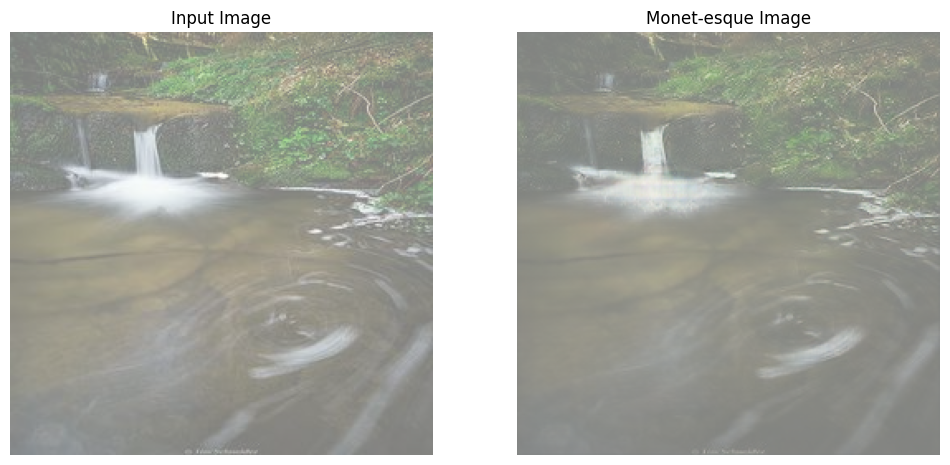

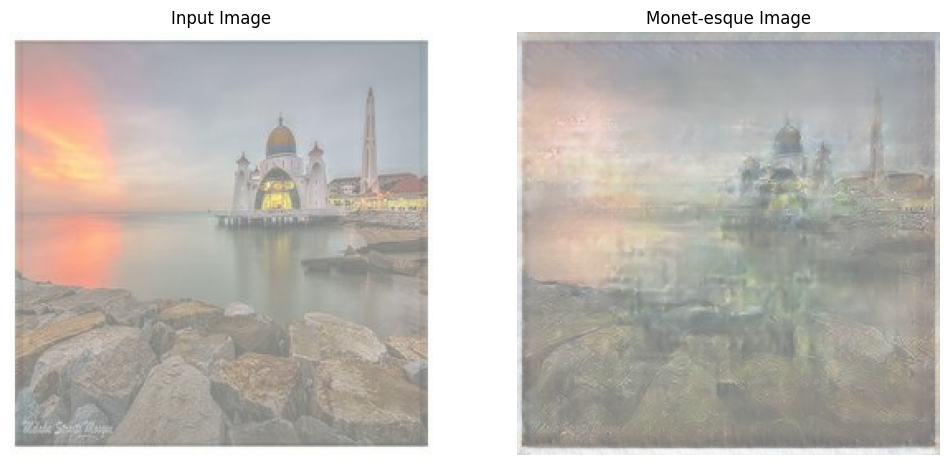

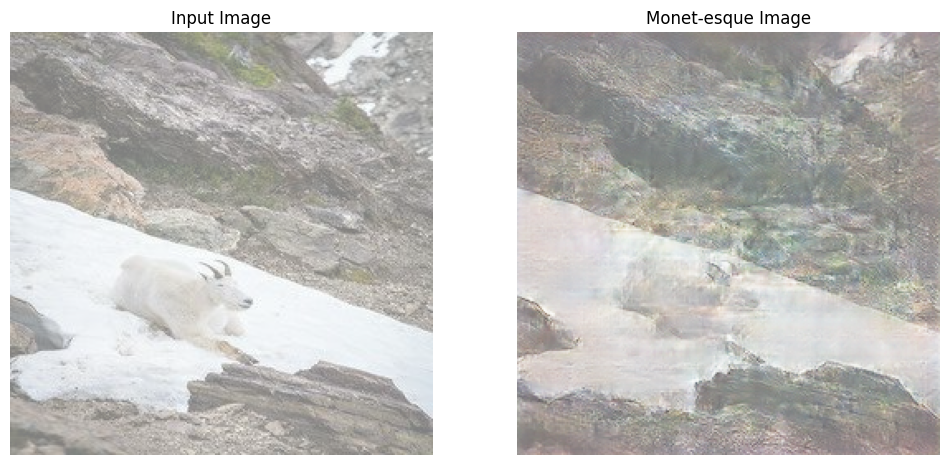

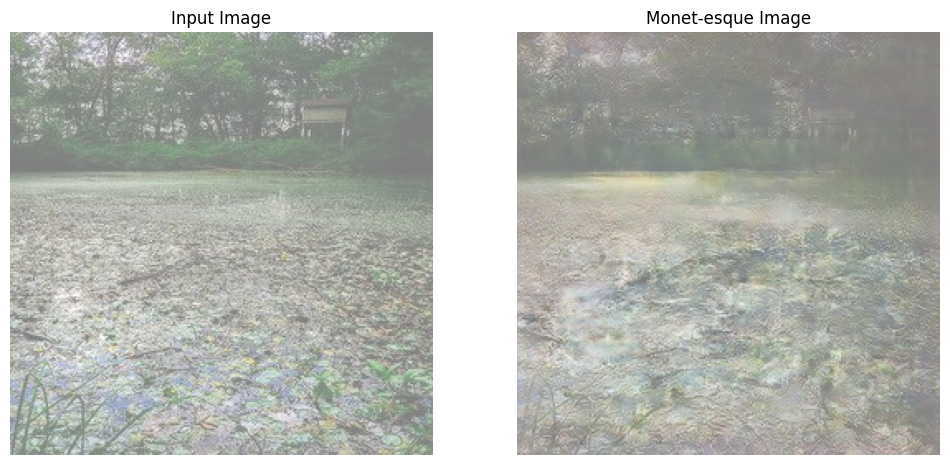

In [28]:
for inp in photo_ds.take(5):
    generate_images(generator_g, inp)

# Submission

#### Generate Monet-esque images of all images in `photos` folder

In [29]:
i = 1
for img in photo_ds.take(7000):
    prediction = generator_g(img)
    prediction = prediction * 0.5 + 0.5
    im = tf.keras.utils.array_to_img(prediction[0], data_format=None, scale=True, dtype=None)
    # im.show()
    im.save(f'./submit_images/{i}.jpg')
    # plt.close()
    i += 1

#### Create a zip file for submission

In [31]:
shutil.make_archive("./images", 'zip', "./submit_images")